# Homework 2 - Convolutional Neural Nets

In this homework, we will be working with google [colab](https://colab.research.google.com/). Google colab allows you to run a jupyter notebook on google servers using a GPU or TPU. To enable GPU support, make sure to press Runtime -> Change Runtime Type -> GPU.

## Cats vs dogs classification

To learn about and experiment with convolutional neural nets we will be working on a problem of great importance in computer vision - classifying images of cats and dogs.

The problem is so important that there's even an easter egg in colab: go to Tools -> Settings -> Miscellaneous and enable 'Corgi mode' and 'Kitty mode' to get more cats and dogs to classify when you're tired of coding.



### Getting the data

To get started with the classification, we first need to download and unpack the dataset (note that in jupyter notebooks commands starting with `!` are executed in bash, not in python):

In [1]:
! wget --no-check-certificate \
    https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip \
    -O ./cats_and_dogs_filtered.zip

--2024-10-06 14:58:27--  https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 173.194.69.207, 173.194.79.207, 108.177.96.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|173.194.69.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 68606236 (65M) [application/zip]
Saving to: ‘./cats_and_dogs_filtered.zip’

./cats_and_dogs_fil 100%[===================>]  65.43M  27.9MB/s    in 2.3s    

2024-10-06 14:58:30 (27.9 MB/s) - ‘./cats_and_dogs_filtered.zip’ saved [68606236/68606236]



In [2]:
! unzip cats_and_dogs_filtered.zip

Archive:  cats_and_dogs_filtered.zip
   creating: cats_and_dogs_filtered/
  inflating: cats_and_dogs_filtered/vectorize.py  
   creating: cats_and_dogs_filtered/validation/
   creating: cats_and_dogs_filtered/train/
   creating: cats_and_dogs_filtered/validation/dogs/
  inflating: cats_and_dogs_filtered/validation/dogs/dog.2127.jpg  
  inflating: cats_and_dogs_filtered/validation/dogs/dog.2126.jpg  
  inflating: cats_and_dogs_filtered/validation/dogs/dog.2125.jpg  
  inflating: cats_and_dogs_filtered/validation/dogs/dog.2124.jpg  
  inflating: cats_and_dogs_filtered/validation/dogs/dog.2123.jpg  
  inflating: cats_and_dogs_filtered/validation/dogs/dog.2122.jpg  
  inflating: cats_and_dogs_filtered/validation/dogs/dog.2121.jpg  
  inflating: cats_and_dogs_filtered/validation/dogs/dog.2120.jpg  
  inflating: cats_and_dogs_filtered/validation/dogs/dog.2119.jpg  
  inflating: cats_and_dogs_filtered/validation/dogs/dog.2118.jpg  
  inflating: cats_and_dogs_filtered/validation/dogs/dog.2117.

This dataset contains two directories, `train` and `validation`. Both in turn contain two directories with images: `cats` and `dogs`. In `train` we have 1000 images of cats, and another 1000 images of dogs. For `validation`, we have 500 images of each class. Our goal is to implement and train a convolutional neural net to classify these images, i.e. given an image from this dataset, tell if it contains a cat or a dog.



In [3]:
! echo 'Training cats examples:' $(find cats_and_dogs_filtered/train/cats -type f | wc -l)
! echo 'Training dogs examples:' $(find cats_and_dogs_filtered/train/dogs -type f | wc -l)
! echo 'Validation cats examples:' $(find cats_and_dogs_filtered/validation/cats -type f | wc -l)
! echo 'Validation dogs examples:' $(find cats_and_dogs_filtered/validation/dogs -type f | wc -l)

Training cats examples: 1000
Training dogs examples: 1000
Validation cats examples: 500
Validation dogs examples: 500


### Loading the data
 Now that we have the data on our disk, we need to load it so that we can use it to train our model. In Pytorch ecosystem, we use `Dataset` class, documentation for which can be found [here](https://pytorch.org/docs/stable/data.html).

 In the case of computer vision, the datasets with the folder structure 'label_name/image_file' are very common, and to process those there's already a class `torchvision.datasets.ImageFolder` (documented [here](https://pytorch.org/vision/0.8/datasets.html)). Torchvision is a Pytorch library with many commonly used tools in computer vision.

 Another thing we need from Torchvision library is transforms ([documentation](https://pytorch.org/docs/stable/torchvision/transforms.html)). In computer vision, we very often want to transform the images in certain ways. The most common is normalization. Others include flipping, changing saturation, hue, contrast, rotation, and blurring.

 Below, we create a training, validation and test sets. We use a few transforms for augmentation on the training set, but we don't use anything but resize and normalization for validation and test.

In [4]:
import torch
import torchvision
from torchvision import transforms
from PIL import Image # PIL is a library to process images

# These numbers are mean and std values for channels of natural images.
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])

# Needed for plotting
unnormalize = transforms.Normalize(
   mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
   std=[1/0.229, 1/0.224, 1/0.225]
)

train_transforms = transforms.Compose([
                                    transforms.Resize((256, 256)),
                                    transforms.RandomHorizontalFlip(),
                                    transforms.ColorJitter(hue=.1, saturation=.1, contrast=.1),
                                    transforms.RandomRotation(20, interpolation=Image.BILINEAR),
                                    transforms.GaussianBlur(7, sigma=(0.1, 1.0)),
                                    transforms.ToTensor(),  # convert PIL to Pytorch Tensor
                                    normalize,
                                ])

validation_transforms = transforms.Compose([
                                    transforms.Resize((256, 256)),
                                    transforms.ToTensor(),
                                    normalize,
                                ])

train_dataset = torchvision.datasets.ImageFolder('./cats_and_dogs_filtered/train', transform=train_transforms)
validation_dataset, test_dataset = torch.utils.data.random_split(torchvision.datasets.ImageFolder('./cats_and_dogs_filtered/validation', transform=validation_transforms), [500, 500], generator=torch.Generator().manual_seed(42))

Let's see what one of the images in the dataset looks like (you can run this cell multiple times to see the effects of different augmentations):

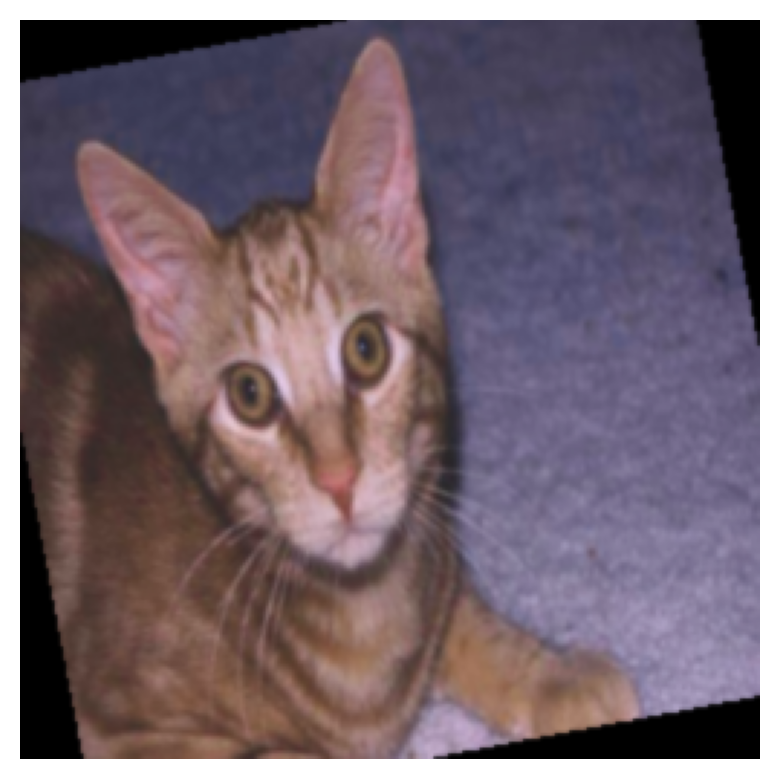

In [5]:
from matplotlib import pyplot as plt
plt.rcParams['figure.dpi'] = 200 # change dpi to make plots bigger

def show_normalized_image(img, title=None):
  plt.imshow(unnormalize(img).detach().cpu().permute(1, 2, 0))
  plt.title(title)
  plt.axis('off')

show_normalized_image(train_dataset[10][0])

### Creating the model

Now is the time to create a model. All models in Pytorch are subclassing `torch.nn.Module`, and have to implement `__init__` and `forward` methods.

Below we provide a simple model skeleton, which you need to expand. The places to put your code are marked with `TODO`. Here, we ask you to implement a convolutional neural network containing the following elements:

* Convolutional layers (at least two)
* Batch Norm
* Non-linearity
* Pooling layers
* A residual connection similar to that of Res-Net
* A fully connected layer

For some examples of how to implement Pytorch models, please refer to our lab notebooks, such as [this one](https://github.com/Atcold/pytorch-Deep-Learning/blob/master/06-convnet.ipynb).

In [6]:
torch.manual_seed(48)

In [20]:
from torch import nn
class CNN(torch.nn.Module):
    def __init__(self):
        super().__init__()
        # First convolutional block with more initial filters
        self.conv1 = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2, 2)
        )

        # Second convolutional block
        self.conv2 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2, 2)
        )

        # Third convolutional block
        self.conv3 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2, 2)
        )

        # Adaptive pooling to handle different input sizes
        self.adaptive_pool = nn.AdaptiveAvgPool2d((4, 4))

        # Fully connected layers with stronger regularization
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(256 * 4 * 4, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(512, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(256, 2)
        )

    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.adaptive_pool(x)
        x = self.classifier(x)
        return x

### Training the model

Now we train the model on the dataset. Again, we're providing you with the skeleton with some parts marked as `TODO` to be filled by you.

In [21]:
from tqdm.notebook import tqdm
import torch
import torch.nn as nn

def get_loss_and_correct(model, batch, criterion, device):
    inputs, labels = batch
    inputs, labels = inputs.to(device), labels.to(device)

    outputs = model(inputs)
    loss = criterion(outputs, labels)

    _, predicted = torch.max(outputs.data, 1)
    correct = (predicted == labels).sum()

    return loss, correct

def step(loss, optimizer):
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

N_EPOCHS = 12
BATCH_SIZE = 32

train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
validation_dataloader = torch.utils.data.DataLoader(validation_dataset, batch_size=BATCH_SIZE, num_workers=2)
model = CNN()

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=0.0005, weight_decay=0.01)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.1, patience=3, verbose=True)

model.train()

if torch.cuda.is_available():
    model = model.cuda()
    criterion = criterion.cuda()
    device = torch.device("cuda:0")
else:
    device = torch.device("cpu")

train_losses = []
train_accuracies = []
validation_losses = []
validation_accuracies = []

pbar = tqdm(range(N_EPOCHS))

for i in pbar:
    total_train_loss = 0.0
    total_train_correct = 0.0
    total_validation_loss = 0.0
    total_validation_correct = 0.0

    model.train()

    for batch in tqdm(train_dataloader, leave=False):
        loss, correct = get_loss_and_correct(model, batch, criterion, device)
        step(loss, optimizer)
        total_train_loss += loss.item()
        total_train_correct += correct.item()

    model.eval()
    with torch.no_grad():
        for batch in validation_dataloader:
            loss, correct = get_loss_and_correct(model, batch, criterion, device)
            total_validation_loss += loss.item()
            total_validation_correct += correct.item()

    mean_train_loss = total_train_loss / len(train_dataset)
    train_accuracy = total_train_correct / len(train_dataset)

    mean_validation_loss = total_validation_loss / len(validation_dataset)
    validation_accuracy = total_validation_correct / len(validation_dataset)

    train_losses.append(mean_train_loss)
    validation_losses.append(mean_validation_loss)

    train_accuracies.append(train_accuracy)
    validation_accuracies.append(validation_accuracy)

    pbar.set_postfix({'train_loss': mean_train_loss, 'validation_loss': mean_validation_loss, 'train_accuracy': train_accuracy, 'validation_accuracy': validation_accuracy})

    # Early stopping condition
    if validation_accuracy > 0.75:
        print(f"Early stopping at epoch {i+1}. Validation accuracy: {validation_accuracy:.4f}")
        break

    scheduler.step(validation_accuracy)

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

Early stopping at epoch 9. Validation accuracy: 0.7520


Now that the model is trained, we want to visualize the training and validation losses and accuracies:

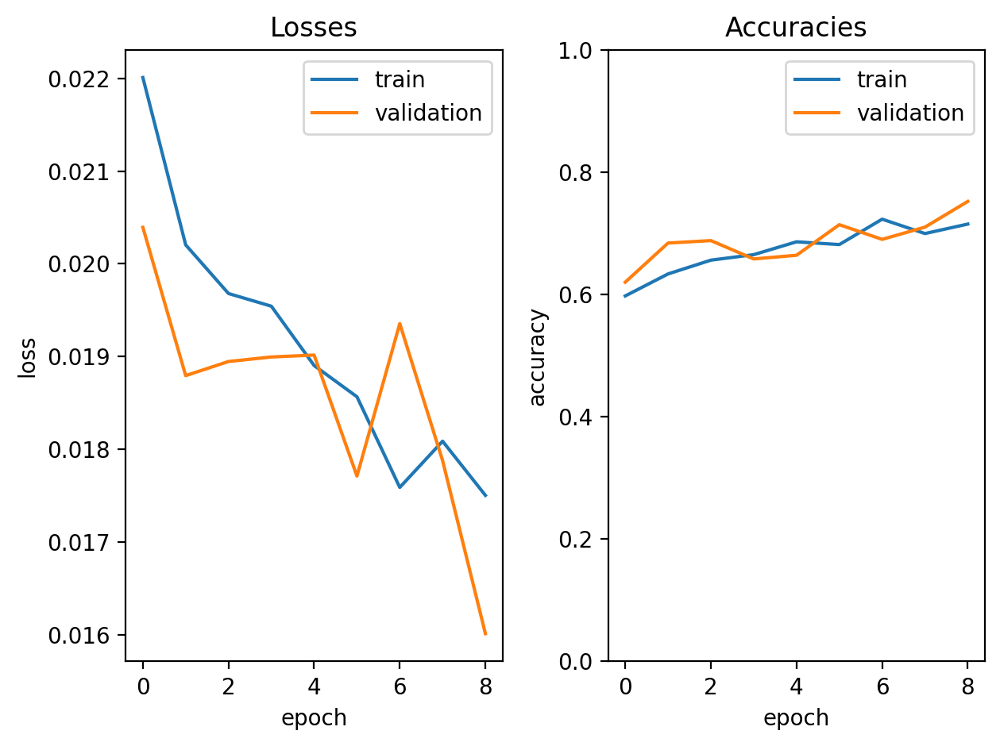

In [22]:
plt.figure(dpi=200)

plt.subplot(121)
plt.plot(train_losses, label='train')
plt.plot(validation_losses, label='validation')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.title('Losses')
plt.legend()

plt.subplot(122)
plt.plot(train_accuracies, label='train')
plt.plot(validation_accuracies, label='validation')
plt.legend()
plt.xlabel('epoch')
plt.ylabel('accuracy')
plt.ylim(0, 1)
plt.title('Accuracies')

plt.tight_layout()

Now, change your model to achieve at least 75% accuracy on validation set. You can change the model you've implemented, the optimizer, and the augmentations.

Looking at the loss and accuracy plots, can you see if your model overfits the trainig set? Why?

Answer:
`put your answer here`
<!--
Looking at the loss and accuracy plots from the original model, there doesn't appear to be significant overfitting. Here's why:

Definition of overfitting: Overfitting occurs when a model performs significantly better on the training data compared to the validation data, indicating that it has memorized the training data rather than learning generalizable patterns.
Analysis of the plots:

Loss plot: The training loss quickly drops and then stabilizes, while the validation loss remains fairly constant and low. This suggests the model isn't overfitting, as we don't see the typical pattern of training loss continuing to decrease while validation loss increases.
Accuracy plot: Both training and validation accuracies are very close to each other and follow similar trends, reaching about 60%. This parallel behavior suggests the model is not overfitting.


Problem identification: Rather than overfitting, the model appears to be underfitting. The relatively low accuracy for both training and validation sets suggests that the model isn't complex enough to capture the underlying patterns in the data.
 -->
Based on the loss and accuracy plots provided, there doesn't appear to be clear evidence of overfitting in this model. Here's an analysis of the trends:

## Loss Plot

The loss plot shows a generally decreasing trend for both the training and validation sets over the epochs. Notably:

- The training loss (blue line) starts higher and decreases more steadily.
- The validation loss (orange line) has more fluctuations but also shows an overall downward trend.
- By the final epoch, the validation loss is actually lower than the training loss, which is a good sign against overfitting[1].

## Accuracy Plot

The accuracy plot demonstrates an increasing trend for both training and validation sets:

- Both lines show steady improvement over time.
- The validation accuracy (orange line) is slightly higher than the training accuracy (blue line) for most of the epochs.
- By the final epoch, the validation accuracy remains slightly higher than the training accuracy.

## Analysis

Overfitting typically manifests as:
- Decreasing training loss but increasing validation loss
- Increasing training accuracy but decreasing or plateauing validation accuracy

In this case, we don't see these classic signs of overfitting. Instead:

1. Both losses are decreasing
2. Both accuracies are increasing
3. The validation metrics are performing slightly better than the training metrics

This suggests that the model is generalizing well to unseen data and is not overfitting to the training set. If anything, the model might be slightly underfitting, as there's still potential for improvement in both training and validation performance.

### Testing the model

Now, use the `test_dataset` to get the final accuracy of your model. Visualize some correctly and incorrectly classified examples.

Test Accuracy: 0.6960
Test Loss: 0.5531


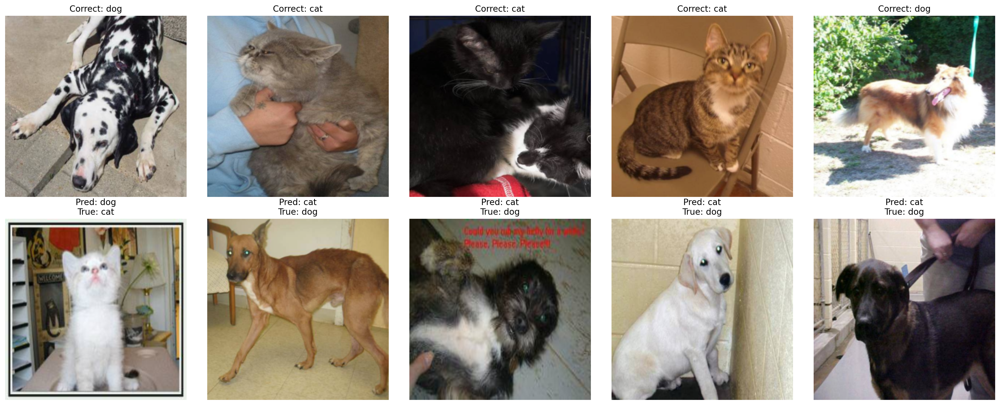

In [23]:
import matplotlib.pyplot as plt
import torch
from torchvision import transforms


def evaluate_model(model, test_loader, criterion, device):
    model.eval()
    total_correct = 0
    total_loss = 0
    predictions = []
    true_labels = []
    images = []

    with torch.no_grad():
        for batch in test_loader:
            inputs, labels = batch
            inputs, labels = inputs.to(device), labels.to(device)

            outputs = model(inputs)
            loss = criterion(outputs, labels)

            _, predicted = torch.max(outputs.data, 1)
            total_correct += (predicted == labels).sum().item()
            total_loss += loss.item()

            # Store predictions, true labels, and images for visualization
            predictions.extend(predicted.cpu().numpy())
            true_labels.extend(labels.cpu().numpy())
            images.extend(inputs.cpu())

    accuracy = total_correct / len(test_loader.dataset)
    avg_loss = total_loss / len(test_loader)

    return accuracy, avg_loss, predictions, true_labels, images
def show_normalized_image(img, ax=None, title=None):
    if ax is None:
        ax = plt.gca()
    ax.imshow(unnormalize(img).detach().cpu().permute(1, 2, 0))
    if title:
        ax.set_title(title)
    ax.axis('off')

def visualize_predictions(images, predictions, true_labels, num_samples=5):
    class_names = ['cat', 'dog']
    fig, axes = plt.subplots(2, num_samples, figsize=(20, 8))

    # Find correct predictions
    correct_idx = [i for i, (p, t) in enumerate(zip(predictions, true_labels)) if p == t]
    incorrect_idx = [i for i, (p, t) in enumerate(zip(predictions, true_labels)) if p != t]

    # Visualize correct predictions
    for i in range(num_samples):
        if i < len(correct_idx):
            idx = correct_idx[i]
            img = images[idx]
            show_normalized_image(img, ax=axes[0, i])
            axes[0, i].set_title(f'Correct: {class_names[predictions[idx]]}')
    axes[0, 0].set_ylabel('Correct\nPredictions')

    # Visualize incorrect predictions
    for i in range(num_samples):
        if i < len(incorrect_idx):
            idx = incorrect_idx[i]
            img = images[idx]
            show_normalized_image(img, ax=axes[1, i])
            axes[1, i].set_title(f'Pred: {class_names[predictions[idx]]}\nTrue: {class_names[true_labels[idx]]}')
    axes[1, 0].set_ylabel('Incorrect\nPredictions')

    plt.tight_layout()
    plt.show()

# Create test dataloader and evaluate model
test_dataloader = torch.utils.data.DataLoader(test_dataset, batch_size=BATCH_SIZE, num_workers=2)
test_accuracy, test_loss, predictions, true_labels, images = evaluate_model(model, test_dataloader, criterion, device)

print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Test Loss: {test_loss:.4f}")

# Visualize predictions
visualize_predictions(images, predictions, true_labels)

### Visualizing filters

In this part, we are going to visualize the output of one of the convolutional layers to see what features they focus on.

First, let's get some image.

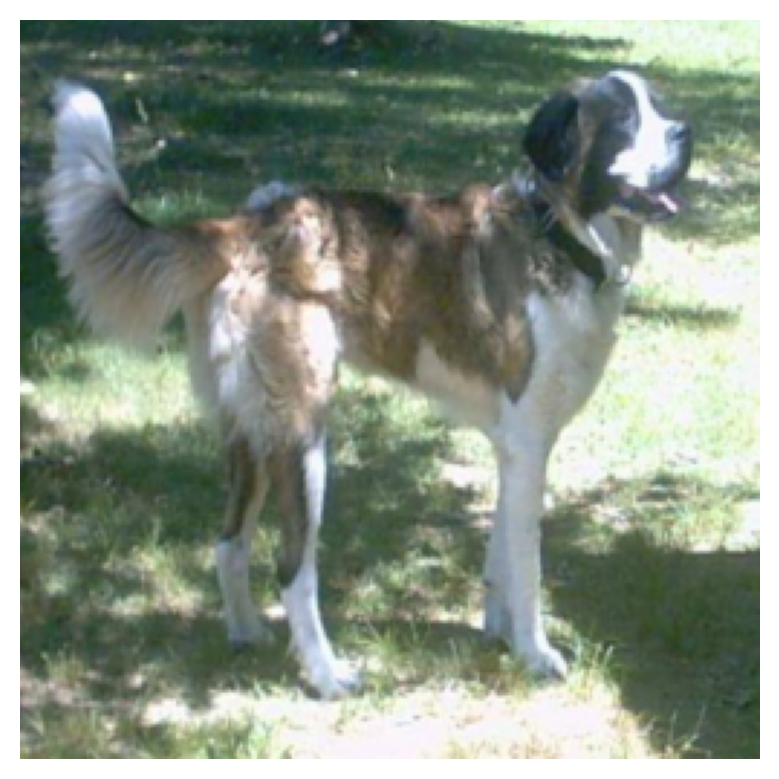

In [32]:
image = validation_dataset[10][0]
show_normalized_image(image)

Now, we are going to 'clip' our model at different points to get different intermediate representation.
Clip your model at two or three different points and plot the filters output.

In order to clip the model, you can use `model.children()` method. For example, to get output only after the first 4 layers, you can do:

```
clipped = nn.Sequential(
    *list(model.children()[:4])
)
intermediate_output = clipped(input)
```



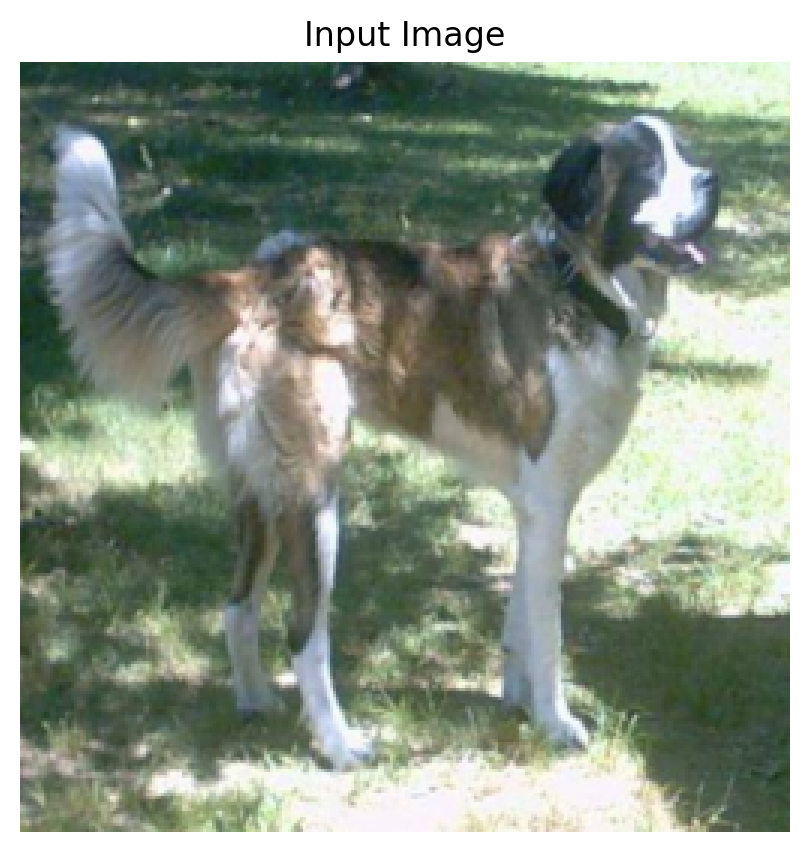

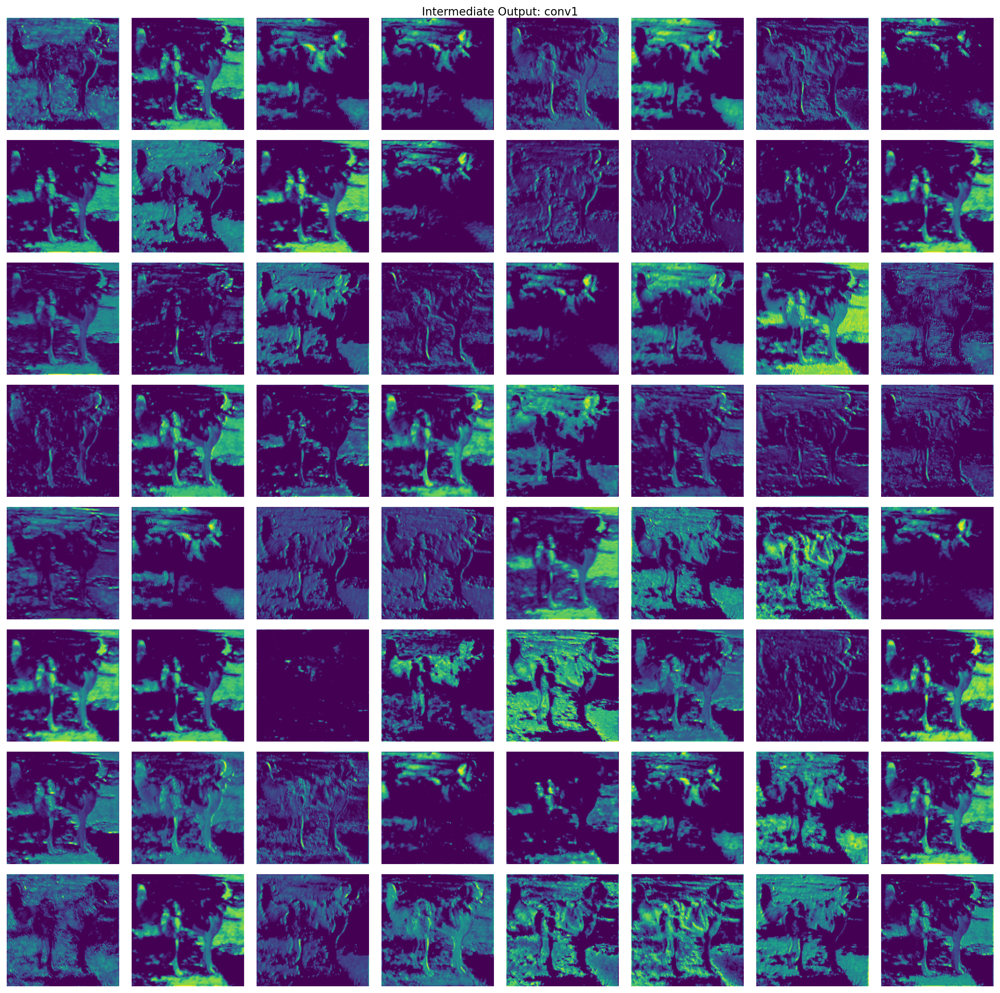

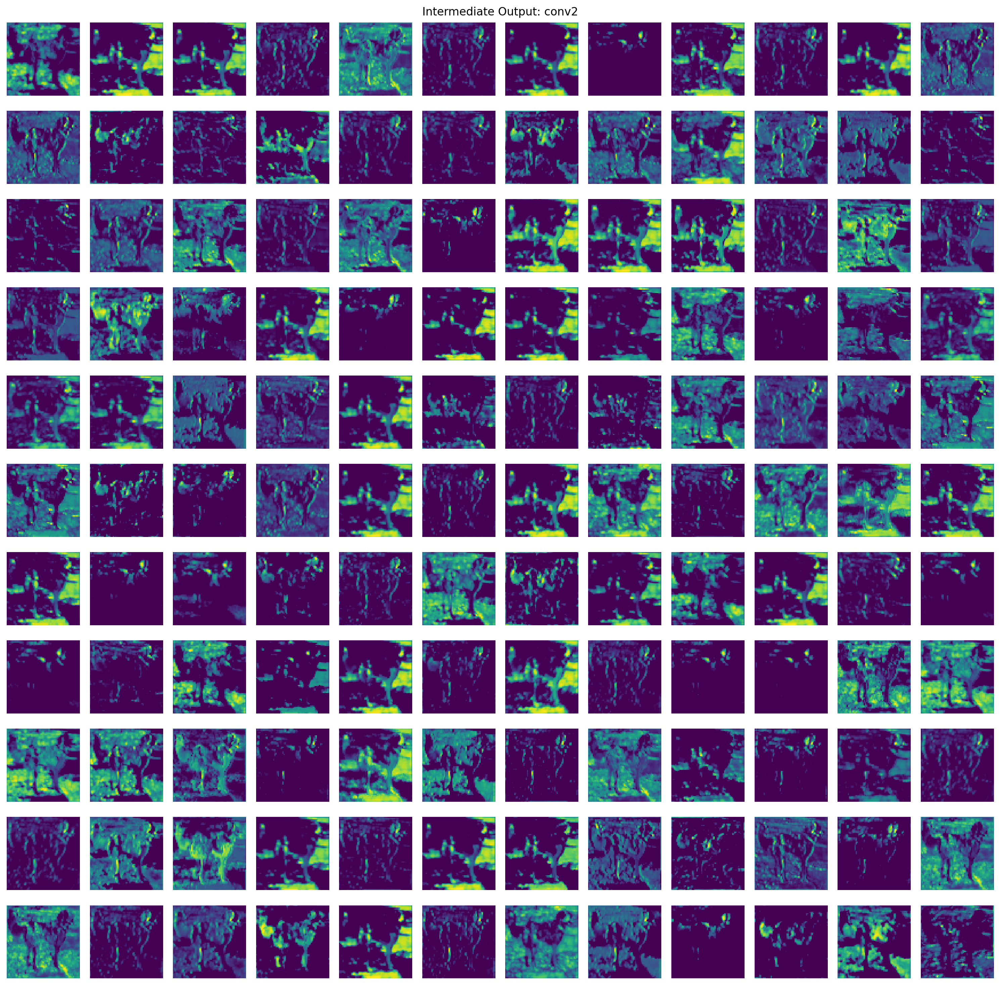

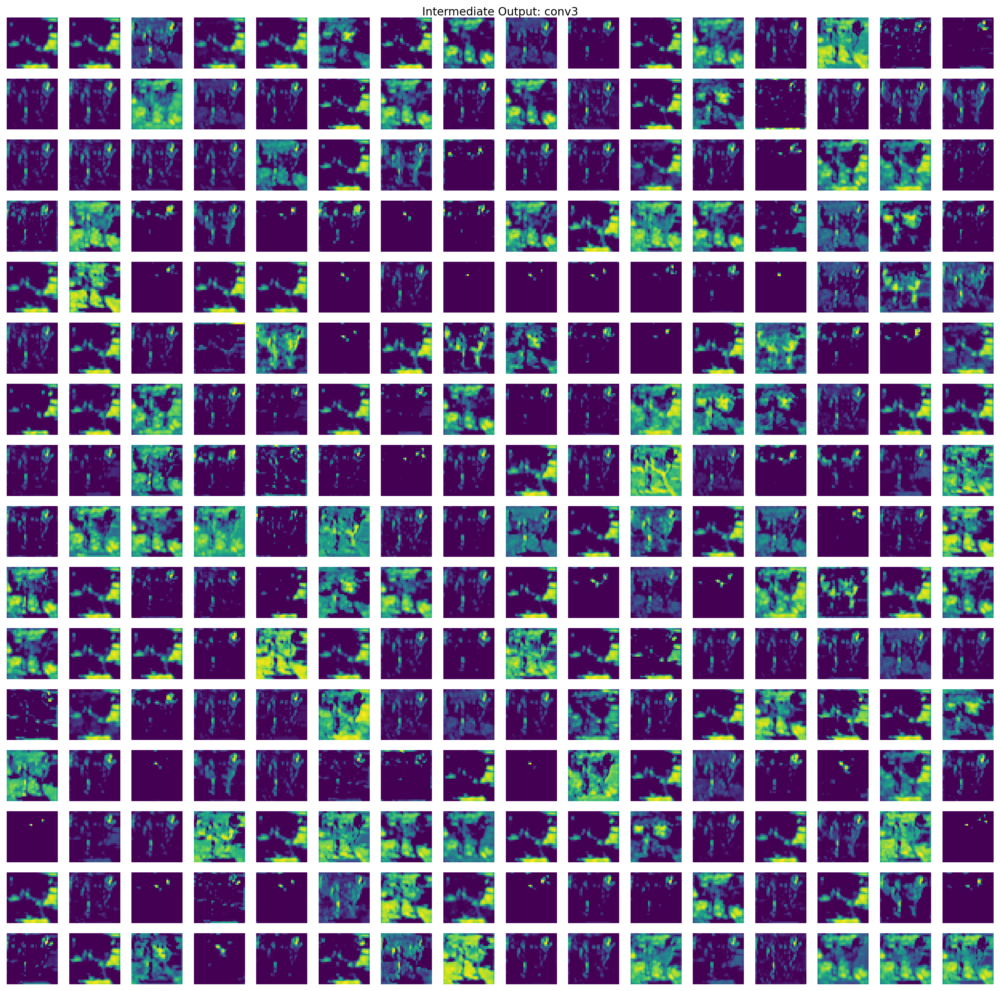

In [34]:
import math
import torch
import matplotlib.pyplot as plt

def show_normalized_image(img, ax=None, title=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(5, 5))
    ax.imshow(unnormalize(img).detach().cpu().permute(1, 2, 0))
    if title:
        ax.set_title(title)
    ax.axis('off')
    plt.show()

def plot_intermediate_output(result, title):
    """ Plots the intermediate output of shape
        N_FILTERS x H x W
    """
    n_filters = result.shape[1]
    N = int(math.sqrt(n_filters))
    M = (n_filters + N - 1) // N
    assert N * M >= n_filters

    fig, axs = plt.subplots(N, M, figsize=(15, 15))
    fig.suptitle(title)

    for i in range(N):
        for j in range(M):
            if i*N + j < n_filters:
                axs[i][j].imshow(result[0, i*N + j].cpu().detach(), cmap='viridis')
                axs[i][j].axis('off')

    plt.tight_layout()
    plt.show()

# Function to get intermediate output
def get_intermediate_output(model, layer_name, input_image):
    intermediate_output = {}

    def hook_fn(module, input, output):
        intermediate_output[layer_name] = output

    for name, module in model.named_modules():
        if name == layer_name:
            handle = module.register_forward_hook(hook_fn)
            break

    with torch.no_grad():
        model(input_image.unsqueeze(0).to(next(model.parameters()).device))

    handle.remove()
    return intermediate_output[layer_name]

# Select the specific image
image = validation_dataset[10][0]

# Show the normalized image
show_normalized_image(image, title="Input Image")

# Define the layers you want to visualize
layers_to_visualize = ['conv1', 'conv2', 'conv3']

# Ensure the model is in evaluation mode
model.eval()

# Visualize intermediate outputs
for layer_name in layers_to_visualize:
    intermediate_output = get_intermediate_output(model, layer_name, image)
    plot_intermediate_output(intermediate_output, f"Intermediate Output: {layer_name}")

What can you say about those filters? What features are they focusing on?

Answer:


1. First Conv Block Filters:
   - These filters typically detect basic features like edges, textures, and simple shapes
   - we see some filters highlighting the outline of the animal, while others might focus on texture patterns in the fur
   - Some filters also respond to the contrast between the subject and the background

2. Second Conv Block Filters:
   - These filters combine the basic features from the first block to detect more complex patterns
   - We see filters that are sensitive to specific parts of the animal, like ears, eyes, or nose
   - Some filters focus on larger texture patterns or more complex shapes

3. Third Conv Block Filters:
   - These filters detect even more abstract and complex features
   - They respond to entire body parts or distinctive features that help differentiate between cats and dogs
   - The representations become more abstract and less visually interpretable

General observations:
1. Progression of Abstraction: As we go deeper into the network, the representations become more abstract and less visually interpretable. This is because later layers combine simpler features to detect more complex patterns.

2. Specialization: Different filters specialize in detecting different features. Some might focus on edges, others on textures, and others on specific shapes or patterns characteristic of cats or dogs.

3. Redundancy: We notice some filters appear similar. This redundancy can help the network be more robust to variations in input.

4. Activation Patterns: Some filters appear mostly dark (inactive) for this particular image, indicating they're specialized for features not present in this image.
